# What's the the deal ? 
This is the UEFA EURO 2016 data set to predict the outcome of the 200+ plausible matches at EURO 2016. This should be funn !! We have access to 4000+ rows of data from previous encounters starting in 2002 for all of the teams playing EURO,2016. This means there are matches where countries have played other countries as well such as Bahrain etc. The data set is pretty simple, the real deal is with the analysis. Time for some exploration. 

In [2]:
setwd("C:/Users/Abhinav/Desktop/DATA_Comp/UEFA_EURO")

Games has the actual data of matches and the outcomes. 

In [3]:
Games <- read.csv("DM_Games.csv")

Tournaments record or list 

In [4]:
Tournaments <- read.csv("DM.csv")

Let's explore around the Games data set and see how the countries are doing, some basic investigation and graphs coming up. 

In [5]:
head(Games)

,Match.Number,Year,Month,Day,Match.Type,Country,Local.Team,Visit.Team,Local.score,Visit.score
1,1,2002,1,4,PMC-1,Bahrain,Bahrain,Finland,0,2
2,2,2002,1,5,PMC-1,Bahrain,Albania,Macedonia,0,0
3,4,2002,1,7,PMC-1,Bahrain,Albania,Finland,1,1
4,3,2002,1,7,PMC-1,Bahrain,Bahrain,Macedonia,1,1
5,5,2002,1,8,Friendly,Oman,Kuwait,Iceland,0,0
6,8,2002,1,10,PMC-1,Bahrain,Bahrain,Albania,3,0


In [6]:
# tabulate match type to get know the type of tournaments played. 
table(Games$Match.Type)


 100-EJL 100-FIFA  100-FLF  100-SFF 100-USSF  125-DBU      AFE    ATV-1 
       1        1        1        1        1        1        1        5 
     BRC      BSE   BtC-20   BtC-21   BtC-22   BtC-23   BtC-24   BtC-25 
       1        1        3        1        3        3        4        4 
   CCF-4    CCF-5    CCF-6    CCF-7      CCT   CIT-10   CIT-11   CIT-12 
       9        8        8        9        1        8        4        4 
  CIT-13   CIT-14    CIT-6    CIT-7    CIT-8    CIT-9   CLC-16   CLC-18 
       4        4        4        4       12        4        2        2 
  CLC-20    CNC-1    EC-12    EC-13    EC-14     FAST Friendly      GFF 
       2        6       31       31       31        3     1952        1 
     JLK    KC-23    KC-25    KC-27    KC-28    KC-30    KC-31     KCCF 
       1        1        3        3        2        2        2        2 
  KCCF-2   KCCF-3   KGC-34   KGC-35   KGC-36   KGC-37   KGC-40   KGC-41 
       2        1        4        4        4      

In [7]:
length(table(Games$Match.Type))

[1] 89

In [8]:
summary(Tournaments)

      Year        Abbreviation
 Min.   :2002   QE-12   : 2   
 1st Qu.:2004   QE-13ÿ  : 2   
 Median :2007   QE-14ÿ  : 2   
 Mean   :2007   QW-19ÿ  : 2   
 3rd Qu.:2010   QW-20ÿ  : 2   
 Max.   :2015   100-EJLÿ: 1   
                (Other) :84   
                                                          Full.name 
 European Football Championship Qualifying Tournament 2002-2003: 2  
 European Football Championship Qualifying Tournament 2006-2007: 2  
 European Football Championship Qualifying Tournament 2010-2011: 2  
 F.I.F.A. World Cup Qualifying Tournament 2004-2005            : 2  
 F.I.F.A. World Cup Qualifying Tournament 2008-2009            : 2  
 F.I.F.A. World Cup Qualifying Tournament 2012-2013            : 2  
 (Other)                                                       :83  
   Base.Team     Ranking      
 None   :19   Min.   :  1.00  
 Japan  : 9   1st Qu.:  2.00  
 Latvia : 5   Median : 22.00  
 Uruguay: 4   Mean   : 32.92  
 Brazil : 3   3rd Qu.: 49.00  
 Denmark: 3   

In [9]:
# tabulate the Abbreviation in tournaments 
table(Tournaments$Abbreviation)


 100-EJLÿ  100-FIFA  100-FLFÿ   100-SFF 100-USSFÿ  125-DBUÿ      AFEÿ    ATV-1ÿ 
        1         1         1         1         1         1         1         1 
     BRCÿ      BSEÿ    BtC-20   BtC-21ÿ   BtC-22ÿ   BtC-23ÿ   BtC-24ÿ   BtC-25ÿ 
        1         1         1         1         1         1         1         1 
    CCF-4    CCF-5ÿ    CCF-6ÿ    CCF-7ÿ      CCTÿ   CIT-10ÿ   CIT-11ÿ   CIT-12ÿ 
        1         1         1         1         1         1         1         1 
  CIT-13ÿ   CIT-14ÿ     CIT-6     CIT-7     CIT-8    CIT-9ÿ    CLC-16    CLC-18 
        1         1         1         1         1         1         1         1 
  CLC-20ÿ    CNC-1ÿ     EC-12    EC-13ÿ    EC-14ÿ      FAST      GFFÿ      JLKÿ 
        1         1         1         1         1         1         1         1 
    KC-23     KC-25    KC-27ÿ    KC-28ÿ    KC-30ÿ    KC-31ÿ   KCCF-2ÿ    KCCF-3 
        1         1         1         1         1         1         1         1 
    KCCFÿ    KGC-34    KGC-

In [10]:
length(table(Tournaments$Abbreviation))

[1] 90

So all in all we know that we have information from 89 past tournament matches, also we have 24 teams in the EURO,2016 in form of 6 groups. Top two from each group qualify automatically while the third placed in the group will have a chance to qualify later in another 6 team play-off from which top four will get to play later thus taking the number of quaterfinalists to 16(12 + 4). 


Now that some amount of background information has been established, we will move to the next phase of the analysis.We need to figure out the features or the factors we believe effect the outcome of a match. Playing at home is certainly an advantage to the home team, France being so. Other than this performance of teams across Europe vs other destination might be useful. 

While the previous data is of importance, time is of the essence. A good recent run is better than say an old perormance. So knowing how long before the match was played, could be useful. Creating a feaure here showing how long before the match was played. EURO,2016 is scheduled for 10th June (Year-2016,Month-6). 

In [11]:
Games$Months_Old <- (2016-Games$Year)*12+(6-Games$Month)

In [12]:
summary(Games$Months_Old)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   45.50   89.00   88.74  130.00  173.00 

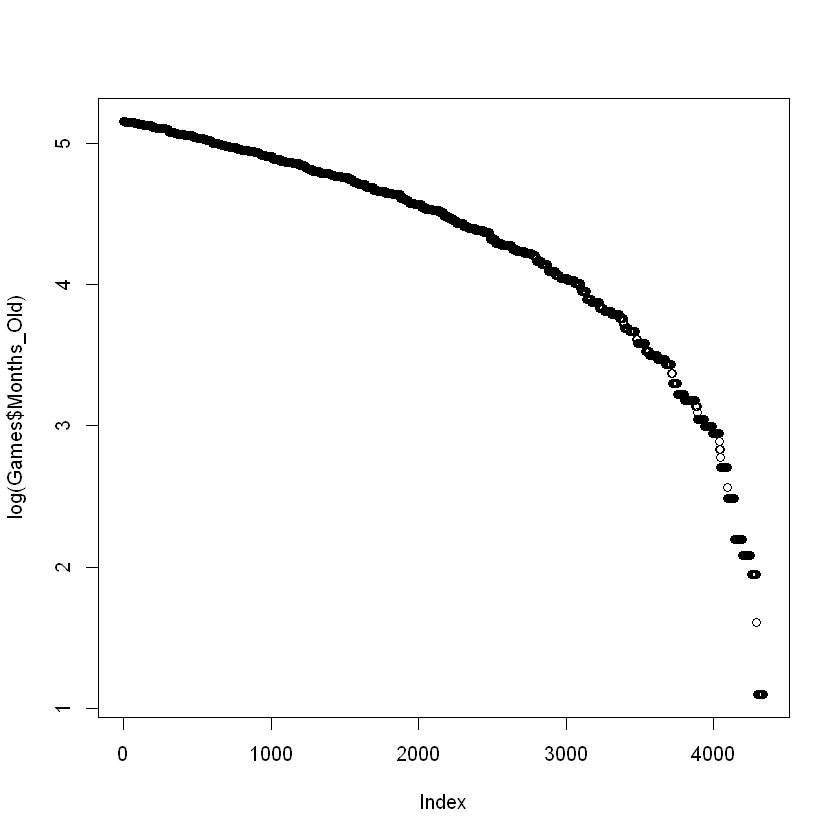

In [13]:
# Idea here is to probably use this as some kind of weight when evaluating performance for a team. 
plot(log(Games$Months_Old))

In [14]:
# Creating the first weight based on how old the match was
Games$weight1 <- 1/(log(Games$Months_Old))

# Scaling the weight to between 0 and 1
Games$weight1 <- Games$weight1/max(Games$weight1)
summary(Games$weight1)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.2132  0.2257  0.2448  0.2769  0.2878  1.0000 

In [15]:
head(Tournaments)

,Year,Abbreviation,Full.name,Base.Team,Ranking
1,2015,QE-15,European Football Championship Qualifying Tournament 2014-2015,None,1
2,2014,KCCF-3,2014 Kirin Challenge Cup Friendly International,Japan,54
3,2014,125-DBUÿ,Dansk Boldspil Union 125th Anniversary Match,Denmark,30
4,2014,RBSÿ,Road to Brazil Series,Spain,9
5,2014,BtC-25ÿ,Baltic Cup 2014,Latvia,96
6,2014,WC-20ÿ,2014 F.I.F.A. World Cup Final Tournament,Germany,1


As it can seen in the above data frame, we have some non-ASCII characters in the Abbrevitation column of the data set, its removal is necessary to match this column with Match.Type from Games. To do an interesting command from base-R is used.Never used it before, works like a charm. 

In [16]:
# No package
Tournaments$Abbreviation <- iconv(Tournaments$Abbreviation,"latin1","ASCII",sub="")

In [17]:
head(Tournaments)

,Year,Abbreviation,Full.name,Base.Team,Ranking
1,2015,QE-15,European Football Championship Qualifying Tournament 2014-2015,None,1
2,2014,KCCF-3,2014 Kirin Challenge Cup Friendly International,Japan,54
3,2014,125-DBU,Dansk Boldspil Union 125th Anniversary Match,Denmark,30
4,2014,RBS,Road to Brazil Series,Spain,9
5,2014,BtC-25,Baltic Cup 2014,Latvia,96
6,2014,WC-20,2014 F.I.F.A. World Cup Final Tournament,Germany,1


Neat and clean, now the first step in trying to come up with outcomes for the teams. We need an approach for this, the one that I would be relying is weighted score of wins. Each one of the 24 participating teams would have won some matches on road to EURO,2016. I will take there wins as a predictor of their ability to win matches in EURO,2016. This score would be weighted in the sense that wins would be multiplied by following weights, how old the match was, quality of opposing team, quality of tournament. 

Quality of tournament would be inversely proportional to the FIFA ranking of the country winning the tournament.  

Ranking is obtained manually, it is the rank of the base country and will be used as a proxy for quality of the tournament.It is the rank of the winner of champion, in case of friendly winner of friendly and cases of none involves those tournaments where teams effectively field their best players such as EURO,FIFA WC  and qualifiers for these.  

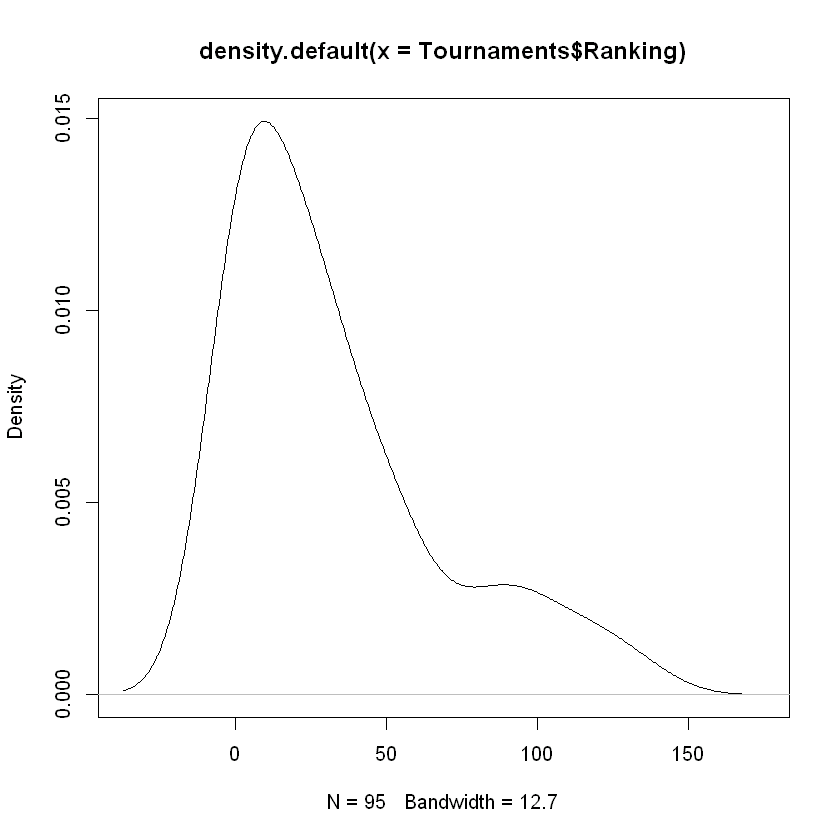

In [18]:
# Plotting Ranking in Tournaments to get a gist of distribution
plot(density(Tournaments$Ranking))

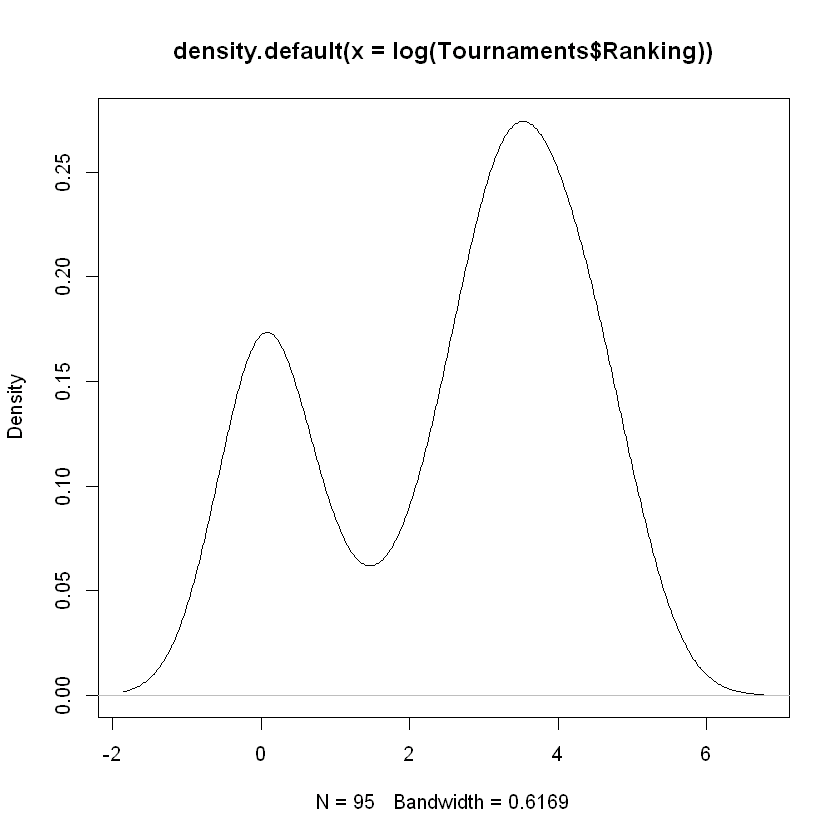

In [19]:
# Apply logirithmic to make it normal 
plot(density(log(Tournaments$Ranking)))

In [20]:
# Creating the new weight 
Tournaments$weight2 <- 1/(1+log(Tournaments$Ranking))

# No scaling needed as the weight is already between 0 and 1
summary(Tournaments$weight2)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.1689  0.2045  0.2444  0.4317  0.5906  1.0000 

Creating the final weight, for which some scrapping was done. A data set with collection of matches from 2002 to present has been done. 

In [21]:
# Loading the new scrapped data set
Country_Points <- read.csv("scrape.csv")

In [22]:
head(Country_Points)

,Visit.Team,Year,Month,Points
1,France,2002,1,0
2,Argentina,2002,1,0
3,Brazil,2002,1,0
4,Portugal,2002,1,0
5,Colombia,2002,1,0
6,Italy,2002,1,0


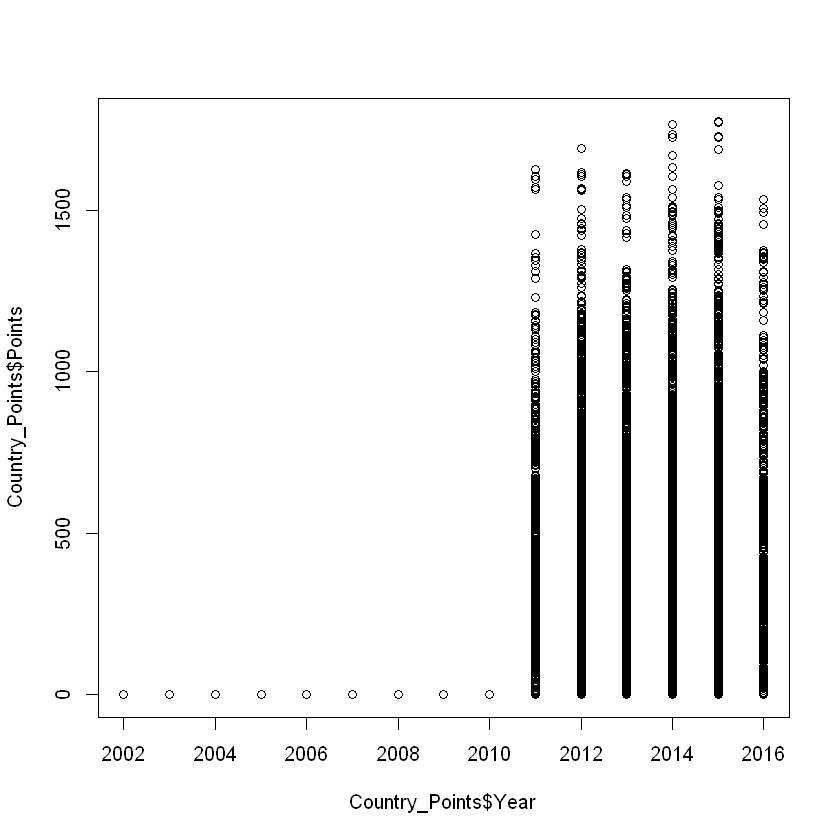

In [23]:
# Plotting the points across the years
plot(Country_Points$Year,Country_Points$Points)

From the year 2002 onwards until 2010, all points are zero. No info about the same is available on the FIFA site either.So only matches from 2011 will be considered. 

In [24]:
Country_Points <- Country_Points[Country_Points$Year>2010,]

Now that the basis for further analysis is done. The final script with all weights will be implemented. The final set of weights is the opposing team's Points(FIFA rated: scraped from http://www.fifa.com/fifa-world-ranking/ranking-table/men/) 
The scripts below combine the original Games data with scrapped points, get all the necessary weights before computing the individual scores for each team. 

In [25]:
# Import Country_Points, Tournaments, Games
Games <- read.csv("DM_Games.csv")
Tournaments <- read.csv("DM.csv")
Country_Points <- read.csv("scrape.csv")

# Convert some vectors to characters from factor so as to compare and do merging. 
Country_Points$Country <- as.character(Country_Points$Country)
Country_Points$Month <- as.character(Country_Points$Month)
Games$Local.Team <- as.character(Games$Local.Team)
Games$Visit.Team <- as.character(Games$Visit.Team)
colnames(Country_Points) <- c("Local.Team","Year","Month","Points")

# Change months from names to numerical (1 to 12)
Country_Points$Month[Country_Points$Month=="January"] <- 1
Country_Points$Month[Country_Points$Month=="February"] <- 2
Country_Points$Month[Country_Points$Month=="March"] <- 3
Country_Points$Month[Country_Points$Month=="April"] <- 4
Country_Points$Month[Country_Points$Month=="May"] <- 5
Country_Points$Month[Country_Points$Month=="Juney"] <- 6
Country_Points$Month[Country_Points$Month=="July"] <- 7
Country_Points$Month[Country_Points$Month=="August"] <- 8
Country_Points$Month[Country_Points$Month=="September"] <- 9
Country_Points$Month[Country_Points$Month=="October"] <- 10
Country_Points$Month[Country_Points$Month=="November"] <- 11
Country_Points$Month[Country_Points$Month=="December"] <- 12

# Get total, the data set with FIFA points along with game results
# Only local.Teams get their points
total <- merge(Games,Country_Points,by=c("Local.Team","Year","Month"))
total$Local.Points <- total$Points
total <- total[,-11]

ERROR: Error in `$<-.data.frame`(`*tmp*`, "Country", value = character(0)): replacement has 0 rows, data has 35183


In [26]:
# Get total, the data set with FIFA points along with game results
# Only Visit.Teams get their points
colnames(Country_Points) <- c("Visit.Team","Year","Month","Points")
total <- merge(total,Country_Points,by=c("Visit.Team","Year","Month"))
total$Visit.Points <- total$Points
total <- total[,-12]
total <- total[c(colnames(Games),"Local.Points","Visit.Points")]
total <- total[order(total$Match.Number),]


# Adding the extra months_old variable which will be converted to weight 1
total$Months_Old <- (2016-total$Year)*12+(6-total$Month)

# Removing the non-ASCII characters from Match.Type (Cleaning)
Tournaments$Abbreviation <- iconv(Tournaments$Abbreviation,"latin1","ASCII",sub="")
colnames(total)[5] <- "Abbreviation"
x <- merge(total,Tournaments,by=c("Abbreviation"),all.x = TRUE)
x <- x[,-c(14,15,16)]
total <- x
rm(x)

# Re-ordering the total data sets columns in the order given below
# Merging re-orders a data set.
names <- c("Match.Number","Year.x","Month","Day","Abbreviation","Country","Local.Team","Visit.Team","Local.score","Visit.score","Local.Points","Visit.Points","Months_Old","Ranking")
total <- total[names]
total <- total[order(total$Match.Number),]
colnames(total)[2] <- "Year"

# Friendly have no ranking, so ranking being replaced by median values (which happens to be 1)
total$Ranking[is.na(total$Ranking)] <- median(total$Ranking[!is.na(total$Ranking)])

# Weights being assigned
total$weight1 <- 1/(1+log(total$Months_Old))
total$weight1 <- total$weight1/max(total$weight1)

total$weight2 <- 1/(1+log(total$Ranking))
total$weight2 <- total$weight2/max(total$weight2)

# Third weight is the points of the opposing team.
# When calculating points for local, we will use weightV and vice versa for Visiting Teams. 
total$weightL <- total$Local.Points/(max(total$Local.Points))
total$weightV <- total$Visit.Points/(max(total$Visit.Points))

# Removing rows when points from FIFA are zero, so our data set is now shrinked from 2002 to 2011
total <- total[total$Local.Points>0.0,]
total <- total[total$Visit.Points>0.0,]

In [27]:
# This is how the final data set looks like before scoring and getting probabilities
head(total)

,Match.Number,Year,Month,Day,Abbreviation,Country,Local.Team,Visit.Team,Local.score,Visit.score,Local.Points,Visit.Points,Months_Old,Ranking,weight1,weight2,weightL,weightV
87,1,2013,1,8,Friendly,South Africa,South Africa,Norway,0,1,422.76,810.42,41,1,0.4452276,1,0.2388394,0.4578489
88,1,2014,1,15,Friendly,United Arab Emirates,Moldova,Norway,1,2,358.98,558.38,29,1,0.480529,1,0.2028067,0.3154582
94,1,2016,1,6,Friendly,United Arab Emirates,Estonia,Sweden,1,1,379.05,771.18,5,1,0.8042392,1,0.2141453,0.4356801
1672,1,2012,1,15,KGC-41,Thailand,Denmark,Norway,1,1,1032.09,788.29,53,54,0.4222312,0.2004416,0.5830819,0.4453465
97,2,2016,1,10,Friendly,United Arab Emirates,Sweden,Finland,3,0,771.18,663.41,5,1,0.8042392,1,0.4356801,0.3747952
98,2,2015,1,16,Friendly,United States,Canada,Iceland,1,2,286.5,760.94,17,1,0.5474812,1,0.1618589,0.429895


In [28]:
# The scoring code
# The 24 countries are listed, for each team , the score is obtained inside the loop
# Since we have both visit and local data, we calculate score individually and then finally add them together
Countries <- read.csv("Countries.csv")
Countries$Country <- as.character(Countries$Country)
Score <- numeric(24)
for(i in 1:24)
{
  Local_Data <- total[total$Local.Team==Countries$Country[i],]
  n_L <- nrow(Local_Data)
  Visit_Data <- total[total$Visit.Team==Countries$Country[i],]
  n_V <- nrow(Visit_Data)
  
  # Difference of their goals multiplied by the three weights  
  Score1 <- (Local_Data$Local.score-Local_Data$Visit.score)*((Local_Data$weight1*Local_Data$weight2*Local_Data$weightV))
  
  Score2 <- (Visit_Data$Visit.score-Visit_Data$Local.score)*((Visit_Data$weight1*Visit_Data$weight2*Visit_Data$weightL))
  
  # Divided by number of games played so that ones who played more matches don't end up with greater points, normalizing scores  
  Score[i] <- (sum(Score1)+sum(Score2))/(n_L+n_V)
}

Countries$Final.Score <- Score
# For France we use only local data as its the local team
# France : case score = sum(Score1)/n_L
Countries[8,2] <- 0.2979965
Countries$Final.Score <- (Countries$Final.Score-min(Countries$Final.Score))/(max(Countries$Final.Score)-min(Countries$Final.Score))


In [29]:

# Obtaining probabilities for a match
MC <- read.csv("MC.csv")
ST <- read.csv("ST.csv")

MC$TEAM.1 <- as.character(MC$TEAM.1)
MC$TEAM.2 <- as.character(MC$TEAM.2)
MC$TEAM.2[MC$TEAM.2=="Italia"] <- "Italy"
for(i in 1:276)
{
  Team1 <- MC[i,2]
  Team2 <- MC[i,3]
# We get the scores for each team playing the match 
  Score1 <- Countries[Countries$Country==Team1,2]
  Score2 <- Countries[Countries$Country==Team2,2]
  P1 = max(Score1,Score2)
  P2 = min(Score1,Score2)
    
# P3 represents the chances of draw here
# If both team scores are similar, the chances of draw increases
# 0.1 multiplication factor obtained empirically 
  P3 = 0.1*log(1/(P1-P2))
    
    # Individual probailities of win,lose and draw from team 1 perpective
  ST$TEAM.1[i] <- Score1/(P1+P2+P3)
  ST$TEAM.2[i] <- Score2/(P1+P2+P3)
  ST$DRAW[i] <- P3/(P1+P2+P3)
}


In [38]:
# Probabilities obtained
head(MC)
head(ST)

,MATCH.NUMBER,TEAM.1,TEAM.2
1,EC001,Albania,Austria
2,EC002,Albania,Belgium
3,EC003,Albania,Croatia
4,EC004,Albania,Czech Republic
5,EC005,Albania,England
6,EC006,Albania,France


,MATCH.NUMBER,TEAM.1,DRAW,TEAM.2
1,EC001,0.1591848,0.5771988,0.2636164
2,EC002,0.1204883,0.1276211,0.7518906
3,EC003,0.1292811,0.1618592,0.7088597
4,EC004,0.1597962,0.3571214,0.4830824
5,EC005,0.09861436,0.06031151,0.8410741
6,EC006,0.07431165,0.007749248,0.9179391


Both of the sets can be matched to obtain the necessary match probabilities

In [40]:
Final <- merge(MC,ST,by="MATCH.NUMBER")

In [42]:
head(Final)

,MATCH.NUMBER,TEAM.1.x,TEAM.2.x,TEAM.1.y,DRAW,TEAM.2.y
1,EC001,Albania,Austria,0.1591848,0.5771988,0.2636164
2,EC002,Albania,Belgium,0.1204883,0.1276211,0.7518906
3,EC003,Albania,Croatia,0.1292811,0.1618592,0.7088597
4,EC004,Albania,Czech Republic,0.1597962,0.3571214,0.4830824
5,EC005,Albania,England,0.09861436,0.06031151,0.8410741
6,EC006,Albania,France,0.07431165,0.007749248,0.9179391


In [43]:
Final[200:210,]

,MATCH.NUMBER,TEAM.1.x,TEAM.2.x,TEAM.1.y,DRAW,TEAM.2.y
200,EC200,North. Ireland,Portugal,0.02247033,0.1494776,0.8280521
201,EC201,North. Ireland,Ireland,0.027334,0.9080467,0.06461934
202,EC202,North. Ireland,Romania,0.03056374,0.3632064,0.6062299
203,EC203,North. Ireland,Russia,0.01954933,0.09677358,0.8836771
204,EC204,North. Ireland,Slovakia,0.03399302,0.5382937,0.4277132
205,EC205,North. Ireland,Spain,0.01549721,0.03807928,0.9464235
206,EC206,North. Ireland,Sweden,0.03420289,0.5576646,0.4081325
207,EC207,North. Ireland,Switzerland,0.02653359,0.2407525,0.7327139
208,EC208,North. Ireland,Turkey,0.03370617,0.5158942,0.4503997
209,EC209,North. Ireland,Ukraine,0.02808092,0.2828073,0.6891118
